In [1]:
%matplotlib inline

In [27]:
from __future__ import print_function
#%matplotlib inline
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# Set random seed for reproducibility
manualSeed = 999
#manualSeed = random.randint(1, 10000) # use if you want new results
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)

Random Seed:  999


In [114]:
# Root directory for dataset
dataroot = "/u/xl/tjlane/cryoem/dynanet/particle_simulations/ortho/jaffed/"

# Number of workers for dataloader
workers = 1

# Batch size during training
batch_size = 128

# Spatial size of training images. All images will be resized to this
#   size using a transformer.
image_size = 64

# Number of channels in the training images. For color images this is 3
nc = 1

# Size of z latent vector (i.e. size of generator input)
nz = 256

# Size of feature maps in generator
ngf = 64

# Size of feature maps in discriminator
ndf = 64

# noise level
noise_level = 0.1

# Number of training epochs
num_epochs = 1000

# Learning rate for optimizers
lr = 0.0002

# Beta1 hyperparam for Adam optimizers
beta1 = 0.5

# Number of GPUs available. Use 0 for CPU mode.
ngpu = 4

torch.Size([128, 1, 64, 64])


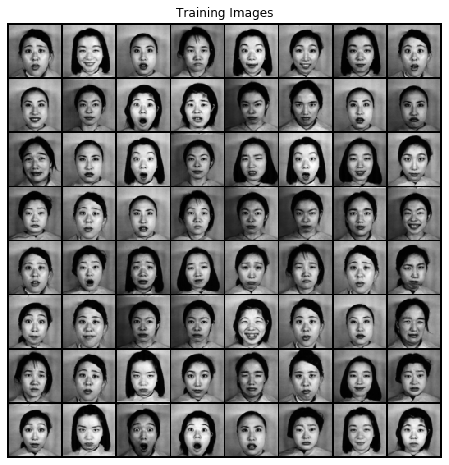

In [115]:
# We can use an image folder dataset the way we have it setup.
# Create the dataset

if nc == 1:
    dataset = dset.ImageFolder(root=dataroot,
                               transform=transforms.Compose([
                                   transforms.Resize(image_size),
                                   transforms.CenterCrop(image_size),
                                   transforms.Grayscale(),
                                   transforms.ToTensor(),
                                   transforms.Normalize((0.5,), (0.5,)),
                               ]))
elif nc == 3:
    dataset = dset.ImageFolder(root=dataroot,
                           transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))
    
# Create the dataloader
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=workers)

# Decide which device we want to run on
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

# Plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

print(real_batch[0].shape)

In [116]:
# custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [117]:
# Generator Code

class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. (ngf*8) x 4 x 4
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. (ngf*2) x 16 x 16
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. (ngf) x 32 x 32
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (nc) x 64 x 64
        )

    def forward(self, input):
        return self.main(input)

In [118]:
# Create the generator
netG = Generator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netG.apply(weights_init)

# Print the model
print(netG)

DataParallel(
  (module): Generator(
    (main): Sequential(
      (0): ConvTranspose2d(256, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
      (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU(inplace=True)
      (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (8): ReLU(inplace=True)
      (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (11): ReLU(inplace=True)
      (12): ConvTranspose2d(64, 1, kernel_size=(4, 4), stride=(2, 2

Discriminator Code



In [119]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is (nc) x 64 x 64
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 32 x 32
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

Now, as with the generator, we can create the discriminator, apply the
``weights_init`` function, and print the model’s structure.




In [120]:
# Create the Discriminator
netD = Discriminator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))
    
# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netD.apply(weights_init)

# Print the model
print(netD)

DataParallel(
  (module): Discriminator(
    (main): Sequential(
      (0): Conv2d(1, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): LeakyReLU(negative_slope=0.2, inplace=True)
      (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (4): LeakyReLU(negative_slope=0.2, inplace=True)
      (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (7): LeakyReLU(negative_slope=0.2, inplace=True)
      (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (10): LeakyReLU(negative_slope=0.2, inplace=True)
      (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    

In [121]:
# Initialize BCELoss function
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1
fake_label = 0

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

## Training ##

In [122]:
# Training Loop

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, data in enumerate(dataloader, 0):
        
        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        # Format batch
        real_cpu = data[0]
        #real_cpu += torch.randn(*real_cpu.shape) * noise_level
        real_cpu.to(device)
        
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label)
        label += torch.randn(*label.shape) * noise_level
        label = label.clamp(0,1).to(device)
        
        # Forward pass real batch through D
        output = netD(real_cpu).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = netG(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = netD(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Add the gradients from the all-real and all-fake batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()
        
        # Output training stats
        if i % 10 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))
        
        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())
        
        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 100 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))
            
        iters += 1

Starting Training Loop...
[0/1000][0/2]	Loss_D: 2.1248	Loss_G: 2.6106	D(x): 0.3828	D(G(z)): 0.6115 / 0.0991
[1/1000][0/2]	Loss_D: 1.7368	Loss_G: 5.7373	D(x): 1.0000	D(G(z)): 0.5889 / 0.0055
[2/1000][0/2]	Loss_D: 0.7568	Loss_G: 6.3598	D(x): 0.9998	D(G(z)): 0.1560 / 0.0027
[3/1000][0/2]	Loss_D: 0.4115	Loss_G: 7.0082	D(x): 0.9824	D(G(z)): 0.1112 / 0.0017
[4/1000][0/2]	Loss_D: 0.2984	Loss_G: 7.0587	D(x): 0.9193	D(G(z)): 0.0804 / 0.0016
[5/1000][0/2]	Loss_D: 0.2881	Loss_G: 7.4391	D(x): 0.9616	D(G(z)): 0.0621 / 0.0010
[6/1000][0/2]	Loss_D: 0.3007	Loss_G: 7.9614	D(x): 0.9597	D(G(z)): 0.0760 / 0.0005
[7/1000][0/2]	Loss_D: 0.2278	Loss_G: 7.2771	D(x): 0.9644	D(G(z)): 0.0310 / 0.0011
[8/1000][0/2]	Loss_D: 0.2534	Loss_G: 7.9005	D(x): 0.9689	D(G(z)): 0.0309 / 0.0005
[9/1000][0/2]	Loss_D: 0.1864	Loss_G: 7.4878	D(x): 0.9422	D(G(z)): 0.0224 / 0.0008
[10/1000][0/2]	Loss_D: 0.1776	Loss_G: 8.2320	D(x): 0.9590	D(G(z)): 0.0156 / 0.0004
[11/1000][0/2]	Loss_D: 0.2022	Loss_G: 8.7904	D(x): 0.9693	D(G(z)): 0.02

[99/1000][0/2]	Loss_D: 0.2166	Loss_G: 4.3249	D(x): 0.9414	D(G(z)): 0.0294 / 0.0176
[100/1000][0/2]	Loss_D: 0.3376	Loss_G: 4.8615	D(x): 0.7905	D(G(z)): 0.0123 / 0.0096
[101/1000][0/2]	Loss_D: 0.3113	Loss_G: 6.1320	D(x): 0.9158	D(G(z)): 0.1006 / 0.0026
[102/1000][0/2]	Loss_D: 0.2786	Loss_G: 4.4750	D(x): 0.8940	D(G(z)): 0.0643 / 0.0141
[103/1000][0/2]	Loss_D: 0.5925	Loss_G: 2.7744	D(x): 0.6172	D(G(z)): 0.0066 / 0.0842
[104/1000][0/2]	Loss_D: 1.8273	Loss_G: 9.1267	D(x): 0.2790	D(G(z)): 0.0000 / 0.0002
[105/1000][0/2]	Loss_D: 0.9807	Loss_G: 10.8022	D(x): 0.9990	D(G(z)): 0.4292 / 0.0001
[106/1000][0/2]	Loss_D: 0.5031	Loss_G: 6.5598	D(x): 0.7204	D(G(z)): 0.0005 / 0.0024
[107/1000][0/2]	Loss_D: 0.6235	Loss_G: 9.2727	D(x): 0.9845	D(G(z)): 0.3191 / 0.0002
[108/1000][0/2]	Loss_D: 0.2723	Loss_G: 3.4484	D(x): 0.9482	D(G(z)): 0.0787 / 0.0414
[109/1000][0/2]	Loss_D: 0.5676	Loss_G: 5.8057	D(x): 0.6377	D(G(z)): 0.0021 / 0.0054
[110/1000][0/2]	Loss_D: 0.4350	Loss_G: 6.9699	D(x): 0.9807	D(G(z)): 0.2021 /

[197/1000][0/2]	Loss_D: 0.2788	Loss_G: 5.6235	D(x): 0.9120	D(G(z)): 0.0701 / 0.0049
[198/1000][0/2]	Loss_D: 0.2887	Loss_G: 6.1667	D(x): 0.9283	D(G(z)): 0.0751 / 0.0030
[199/1000][0/2]	Loss_D: 0.2827	Loss_G: 6.5880	D(x): 0.9454	D(G(z)): 0.0838 / 0.0020
[200/1000][0/2]	Loss_D: 0.5958	Loss_G: 13.1744	D(x): 0.9814	D(G(z)): 0.2845 / 0.0000
[201/1000][0/2]	Loss_D: 0.4839	Loss_G: 4.7517	D(x): 0.9985	D(G(z)): 0.1439 / 0.0116
[202/1000][0/2]	Loss_D: 0.2337	Loss_G: 8.5651	D(x): 0.9534	D(G(z)): 0.0041 / 0.0003
[203/1000][0/2]	Loss_D: 0.5337	Loss_G: 9.2799	D(x): 0.9868	D(G(z)): 0.2409 / 0.0002
[204/1000][0/2]	Loss_D: 0.5442	Loss_G: 8.2054	D(x): 0.9921	D(G(z)): 0.2345 / 0.0005
[205/1000][0/2]	Loss_D: 0.4005	Loss_G: 3.6991	D(x): 0.7635	D(G(z)): 0.0071 / 0.0572
[206/1000][0/2]	Loss_D: 0.4259	Loss_G: 5.6231	D(x): 0.7451	D(G(z)): 0.0030 / 0.0045
[207/1000][0/2]	Loss_D: 0.2994	Loss_G: 5.6260	D(x): 0.9772	D(G(z)): 0.1150 / 0.0046
[208/1000][0/2]	Loss_D: 0.2579	Loss_G: 4.0246	D(x): 0.8744	D(G(z)): 0.0196 

[295/1000][0/2]	Loss_D: 0.2596	Loss_G: 5.4753	D(x): 0.9690	D(G(z)): 0.0706 / 0.0052
[296/1000][0/2]	Loss_D: 0.3896	Loss_G: 6.7552	D(x): 0.9644	D(G(z)): 0.1682 / 0.0016
[297/1000][0/2]	Loss_D: 0.4797	Loss_G: 7.3660	D(x): 0.9892	D(G(z)): 0.2409 / 0.0010
[298/1000][0/2]	Loss_D: 0.2250	Loss_G: 5.4701	D(x): 0.8981	D(G(z)): 0.0036 / 0.0059
[299/1000][0/2]	Loss_D: 0.2688	Loss_G: 5.2859	D(x): 0.9780	D(G(z)): 0.0877 / 0.0070
[300/1000][0/2]	Loss_D: 0.2505	Loss_G: 4.1774	D(x): 0.9249	D(G(z)): 0.0548 / 0.0214
[301/1000][0/2]	Loss_D: 0.3002	Loss_G: 5.0782	D(x): 0.9140	D(G(z)): 0.0728 / 0.0085
[302/1000][0/2]	Loss_D: 0.2618	Loss_G: 5.3261	D(x): 0.9575	D(G(z)): 0.0923 / 0.0063
[303/1000][0/2]	Loss_D: 0.2387	Loss_G: 3.8517	D(x): 0.8996	D(G(z)): 0.0391 / 0.0278
[304/1000][0/2]	Loss_D: 0.2856	Loss_G: 3.9831	D(x): 0.8632	D(G(z)): 0.0261 / 0.0252
[305/1000][0/2]	Loss_D: 0.2285	Loss_G: 4.7687	D(x): 0.9014	D(G(z)): 0.0263 / 0.0109
[306/1000][0/2]	Loss_D: 0.2307	Loss_G: 5.5292	D(x): 0.9522	D(G(z)): 0.0696 /

[393/1000][0/2]	Loss_D: 0.2495	Loss_G: 6.2571	D(x): 0.9622	D(G(z)): 0.0748 / 0.0025
[394/1000][0/2]	Loss_D: 0.2156	Loss_G: 4.8752	D(x): 0.9465	D(G(z)): 0.0284 / 0.0096
[395/1000][0/2]	Loss_D: 0.2558	Loss_G: 5.1248	D(x): 0.9154	D(G(z)): 0.0273 / 0.0078
[396/1000][0/2]	Loss_D: 0.2008	Loss_G: 4.6763	D(x): 0.9290	D(G(z)): 0.0357 / 0.0117
[397/1000][0/2]	Loss_D: 0.2207	Loss_G: 5.4794	D(x): 0.9527	D(G(z)): 0.0413 / 0.0053
[398/1000][0/2]	Loss_D: 0.2546	Loss_G: 6.0335	D(x): 0.9759	D(G(z)): 0.0713 / 0.0029
[399/1000][0/2]	Loss_D: 0.2131	Loss_G: 4.6280	D(x): 0.9249	D(G(z)): 0.0135 / 0.0133
[400/1000][0/2]	Loss_D: 0.2569	Loss_G: 5.4633	D(x): 0.9194	D(G(z)): 0.0119 / 0.0055
[401/1000][0/2]	Loss_D: 0.2489	Loss_G: 5.7685	D(x): 0.9668	D(G(z)): 0.0468 / 0.0044
[402/1000][0/2]	Loss_D: 0.2993	Loss_G: 6.6533	D(x): 0.9721	D(G(z)): 0.0835 / 0.0017
[403/1000][0/2]	Loss_D: 0.2732	Loss_G: 6.0465	D(x): 0.9843	D(G(z)): 0.0726 / 0.0030
[404/1000][0/2]	Loss_D: 0.2196	Loss_G: 4.8491	D(x): 0.9124	D(G(z)): 0.0082 /

[491/1000][0/2]	Loss_D: 0.2379	Loss_G: 4.9612	D(x): 0.9353	D(G(z)): 0.0345 / 0.0104
[492/1000][0/2]	Loss_D: 0.1967	Loss_G: 5.0213	D(x): 0.9572	D(G(z)): 0.0300 / 0.0091
[493/1000][0/2]	Loss_D: 0.2210	Loss_G: 5.2157	D(x): 0.9494	D(G(z)): 0.0235 / 0.0075
[494/1000][0/2]	Loss_D: 0.2305	Loss_G: 4.8047	D(x): 0.9435	D(G(z)): 0.0331 / 0.0115
[495/1000][0/2]	Loss_D: 0.1975	Loss_G: 4.8725	D(x): 0.9355	D(G(z)): 0.0224 / 0.0098
[496/1000][0/2]	Loss_D: 0.2253	Loss_G: 5.4985	D(x): 0.9675	D(G(z)): 0.0587 / 0.0054
[497/1000][0/2]	Loss_D: 0.1963	Loss_G: 4.1295	D(x): 0.9190	D(G(z)): 0.0176 / 0.0203
[498/1000][0/2]	Loss_D: 0.2091	Loss_G: 4.8904	D(x): 0.9085	D(G(z)): 0.0126 / 0.0097
[499/1000][0/2]	Loss_D: 0.1925	Loss_G: 4.6077	D(x): 0.9252	D(G(z)): 0.0263 / 0.0122
[500/1000][0/2]	Loss_D: 0.2329	Loss_G: 4.8322	D(x): 0.9356	D(G(z)): 0.0438 / 0.0096
[501/1000][0/2]	Loss_D: 0.2205	Loss_G: 4.0166	D(x): 0.9067	D(G(z)): 0.0197 / 0.0224
[502/1000][0/2]	Loss_D: 0.2664	Loss_G: 4.1430	D(x): 0.8570	D(G(z)): 0.0080 /

[589/1000][0/2]	Loss_D: 0.2355	Loss_G: 4.4464	D(x): 0.9413	D(G(z)): 0.0298 / 0.0163
[590/1000][0/2]	Loss_D: 0.2572	Loss_G: 3.8044	D(x): 0.8862	D(G(z)): 0.0348 / 0.0306
[591/1000][0/2]	Loss_D: 0.2273	Loss_G: 4.6433	D(x): 0.8905	D(G(z)): 0.0133 / 0.0127
[592/1000][0/2]	Loss_D: 0.2422	Loss_G: 5.5993	D(x): 0.9657	D(G(z)): 0.0664 / 0.0047
[593/1000][0/2]	Loss_D: 0.1903	Loss_G: 4.3147	D(x): 0.9452	D(G(z)): 0.0196 / 0.0162
[594/1000][0/2]	Loss_D: 0.2100	Loss_G: 4.7132	D(x): 0.9479	D(G(z)): 0.0328 / 0.0120
[595/1000][0/2]	Loss_D: 0.2253	Loss_G: 4.3066	D(x): 0.9021	D(G(z)): 0.0118 / 0.0189
[596/1000][0/2]	Loss_D: 0.2298	Loss_G: 5.1648	D(x): 0.9718	D(G(z)): 0.0495 / 0.0072
[597/1000][0/2]	Loss_D: 0.2201	Loss_G: 4.0196	D(x): 0.8983	D(G(z)): 0.0110 / 0.0238
[598/1000][0/2]	Loss_D: 0.1896	Loss_G: 5.1256	D(x): 0.9566	D(G(z)): 0.0297 / 0.0084
[599/1000][0/2]	Loss_D: 0.2122	Loss_G: 4.6003	D(x): 0.9456	D(G(z)): 0.0247 / 0.0135
[600/1000][0/2]	Loss_D: 0.2241	Loss_G: 4.5321	D(x): 0.9292	D(G(z)): 0.0228 /

[687/1000][0/2]	Loss_D: 0.1849	Loss_G: 4.4953	D(x): 0.9282	D(G(z)): 0.0180 / 0.0158
[688/1000][0/2]	Loss_D: 0.2974	Loss_G: 4.3633	D(x): 0.9012	D(G(z)): 0.0320 / 0.0194
[689/1000][0/2]	Loss_D: 0.2399	Loss_G: 4.6896	D(x): 0.9093	D(G(z)): 0.0184 / 0.0127
[690/1000][0/2]	Loss_D: 0.2011	Loss_G: 4.8278	D(x): 0.9283	D(G(z)): 0.0249 / 0.0113
[691/1000][0/2]	Loss_D: 0.1867	Loss_G: 5.0945	D(x): 0.9545	D(G(z)): 0.0240 / 0.0083
[692/1000][0/2]	Loss_D: 0.2602	Loss_G: 4.6541	D(x): 0.9272	D(G(z)): 0.0386 / 0.0130
[693/1000][0/2]	Loss_D: 0.1955	Loss_G: 5.2772	D(x): 0.9669	D(G(z)): 0.0365 / 0.0067
[694/1000][0/2]	Loss_D: 0.2395	Loss_G: 4.6959	D(x): 0.9353	D(G(z)): 0.0307 / 0.0129
[695/1000][0/2]	Loss_D: 0.1982	Loss_G: 5.1943	D(x): 0.9092	D(G(z)): 0.0087 / 0.0078
[696/1000][0/2]	Loss_D: 0.2221	Loss_G: 5.2302	D(x): 0.9749	D(G(z)): 0.0313 / 0.0073
[697/1000][0/2]	Loss_D: 0.2185	Loss_G: 5.2600	D(x): 0.9624	D(G(z)): 0.0382 / 0.0085
[698/1000][0/2]	Loss_D: 0.2098	Loss_G: 5.2091	D(x): 0.9284	D(G(z)): 0.0160 /

[785/1000][0/2]	Loss_D: 0.1978	Loss_G: 4.7799	D(x): 0.9507	D(G(z)): 0.0283 / 0.0108
[786/1000][0/2]	Loss_D: 0.2067	Loss_G: 3.7807	D(x): 0.9017	D(G(z)): 0.0104 / 0.0329
[787/1000][0/2]	Loss_D: 0.1818	Loss_G: 5.3130	D(x): 0.9302	D(G(z)): 0.0125 / 0.0075
[788/1000][0/2]	Loss_D: 0.2416	Loss_G: 5.6517	D(x): 0.9813	D(G(z)): 0.0520 / 0.0050
[789/1000][0/2]	Loss_D: 0.2077	Loss_G: 3.9204	D(x): 0.9142	D(G(z)): 0.0110 / 0.0303
[790/1000][0/2]	Loss_D: 0.2238	Loss_G: 5.0979	D(x): 0.9009	D(G(z)): 0.0051 / 0.0085
[791/1000][0/2]	Loss_D: 0.1936	Loss_G: 4.8339	D(x): 0.9438	D(G(z)): 0.0138 / 0.0102
[792/1000][0/2]	Loss_D: 0.1847	Loss_G: 4.7621	D(x): 0.9470	D(G(z)): 0.0210 / 0.0112
[793/1000][0/2]	Loss_D: 0.1933	Loss_G: 5.1111	D(x): 0.9336	D(G(z)): 0.0086 / 0.0086
[794/1000][0/2]	Loss_D: 0.2372	Loss_G: 6.1688	D(x): 0.9825	D(G(z)): 0.0723 / 0.0032
[795/1000][0/2]	Loss_D: 0.1781	Loss_G: 4.4848	D(x): 0.9463	D(G(z)): 0.0138 / 0.0161
[796/1000][0/2]	Loss_D: 0.1958	Loss_G: 5.4039	D(x): 0.9437	D(G(z)): 0.0110 /

[883/1000][0/2]	Loss_D: 0.2712	Loss_G: 4.1624	D(x): 0.8627	D(G(z)): 0.0162 / 0.0226
[884/1000][0/2]	Loss_D: 0.2438	Loss_G: 5.3122	D(x): 0.9547	D(G(z)): 0.0673 / 0.0067
[885/1000][0/2]	Loss_D: 0.3316	Loss_G: 6.4236	D(x): 0.9780	D(G(z)): 0.1575 / 0.0022
[886/1000][0/2]	Loss_D: 0.2262	Loss_G: 4.4681	D(x): 0.9565	D(G(z)): 0.0360 / 0.0161
[887/1000][0/2]	Loss_D: 0.2068	Loss_G: 5.1134	D(x): 0.9293	D(G(z)): 0.0236 / 0.0099
[888/1000][0/2]	Loss_D: 0.2421	Loss_G: 4.8066	D(x): 0.9482	D(G(z)): 0.0496 / 0.0112
[889/1000][0/2]	Loss_D: 0.2527	Loss_G: 4.9856	D(x): 0.9550	D(G(z)): 0.0756 / 0.0087
[890/1000][0/2]	Loss_D: 0.2077	Loss_G: 4.6381	D(x): 0.9359	D(G(z)): 0.0209 / 0.0133
[891/1000][0/2]	Loss_D: 0.2430	Loss_G: 4.8994	D(x): 0.9479	D(G(z)): 0.0376 / 0.0098
[892/1000][0/2]	Loss_D: 0.2318	Loss_G: 3.8910	D(x): 0.9056	D(G(z)): 0.0339 / 0.0284
[893/1000][0/2]	Loss_D: 0.2075	Loss_G: 4.7727	D(x): 0.9281	D(G(z)): 0.0301 / 0.0114
[894/1000][0/2]	Loss_D: 0.2545	Loss_G: 4.6530	D(x): 0.9477	D(G(z)): 0.0483 /

[981/1000][0/2]	Loss_D: 0.1946	Loss_G: 4.6356	D(x): 0.9244	D(G(z)): 0.0143 / 0.0130
[982/1000][0/2]	Loss_D: 0.1775	Loss_G: 5.0893	D(x): 0.9645	D(G(z)): 0.0266 / 0.0083
[983/1000][0/2]	Loss_D: 0.2007	Loss_G: 4.8918	D(x): 0.9606	D(G(z)): 0.0348 / 0.0098
[984/1000][0/2]	Loss_D: 0.1887	Loss_G: 4.9192	D(x): 0.9364	D(G(z)): 0.0100 / 0.0094
[985/1000][0/2]	Loss_D: 0.2072	Loss_G: 5.2881	D(x): 0.9758	D(G(z)): 0.0260 / 0.0068
[986/1000][0/2]	Loss_D: 0.2016	Loss_G: 5.1785	D(x): 0.9646	D(G(z)): 0.0191 / 0.0077
[987/1000][0/2]	Loss_D: 0.1961	Loss_G: 4.9041	D(x): 0.9579	D(G(z)): 0.0251 / 0.0107
[988/1000][0/2]	Loss_D: 0.2093	Loss_G: 4.2486	D(x): 0.9196	D(G(z)): 0.0146 / 0.0189
[989/1000][0/2]	Loss_D: 0.2020	Loss_G: 5.4081	D(x): 0.9586	D(G(z)): 0.0153 / 0.0059
[990/1000][0/2]	Loss_D: 0.1873	Loss_G: 4.9884	D(x): 0.9732	D(G(z)): 0.0269 / 0.0091
[991/1000][0/2]	Loss_D: 0.2035	Loss_G: 4.5884	D(x): 0.9169	D(G(z)): 0.0104 / 0.0143
[992/1000][0/2]	Loss_D: 0.1997	Loss_G: 5.4178	D(x): 0.9602	D(G(z)): 0.0171 /

Results
-------

Finally, lets check out how we did. Here, we will look at three
different results. First, we will see how D and G’s losses changed
during training. Second, we will visualize G’s output on the fixed_noise
batch for every epoch. And third, we will look at a batch of real data
next to a batch of fake data from G.

**Loss versus training iteration**

Below is a plot of D & G’s losses versus training iterations.




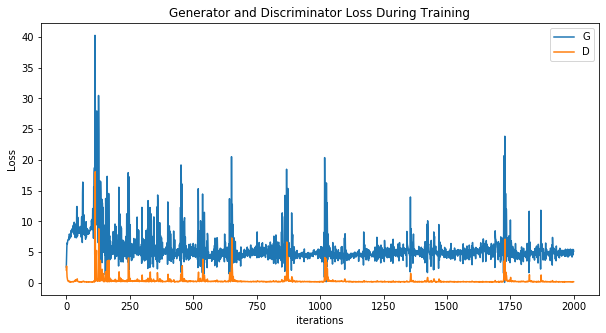

In [123]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

**Visualization of G’s progression**

Remember how we saved the generator’s output on the fixed_noise batch
after every epoch of training. Now, we can visualize the training
progression of G with an animation. Press the play button to start the
animation.




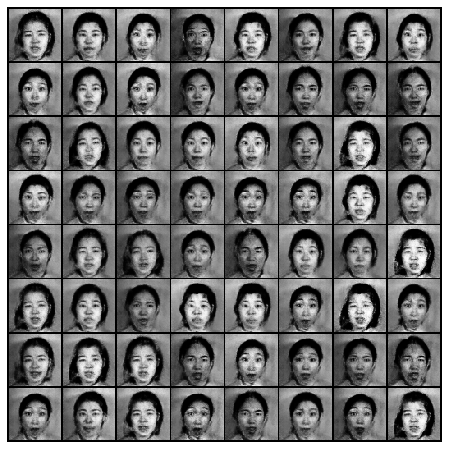

In [127]:
#%%capture
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

**Real Images vs. Fake Images**

Finally, lets take a look at some real images and fake images side by
side.




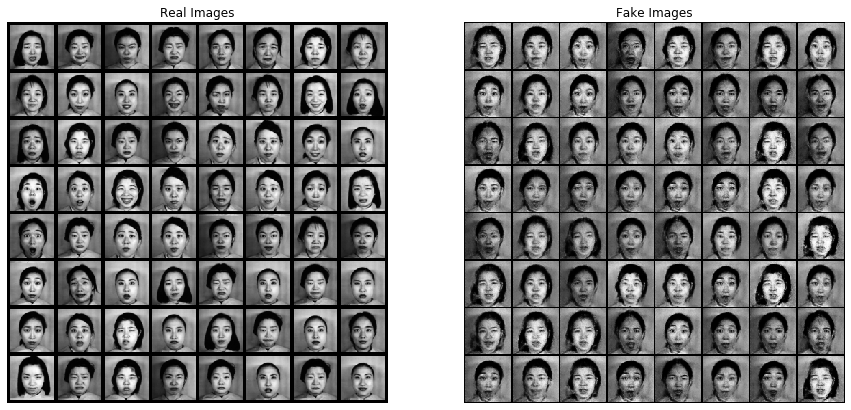

In [128]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(dataloader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)

plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.savefig('fakes_z%d_e%d.png' % (nz, num_epochs))
plt.show()

### trace out latent space

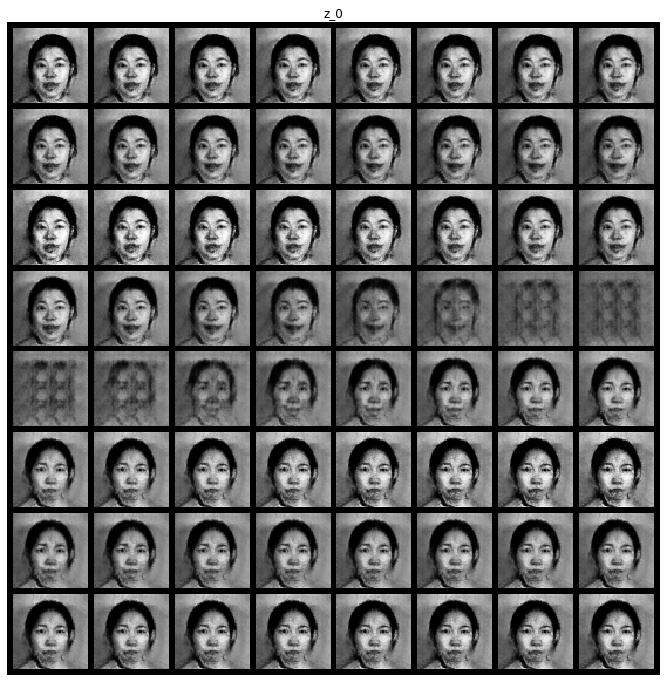

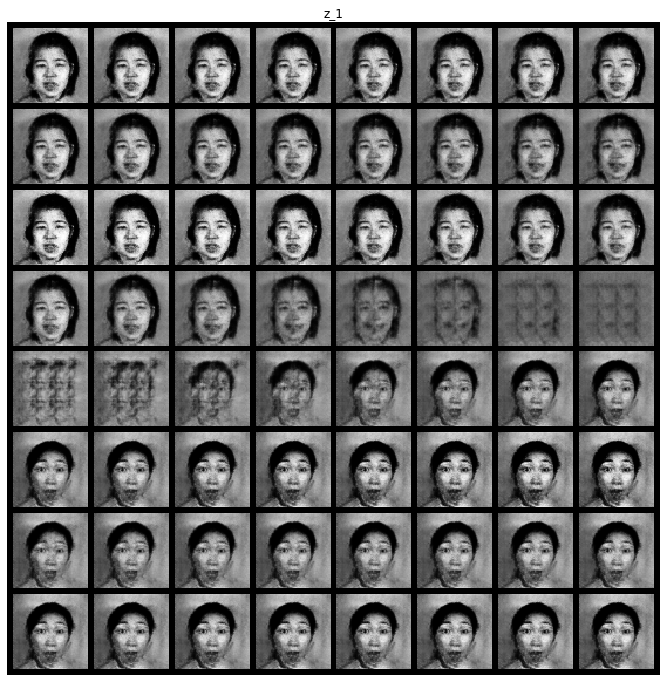

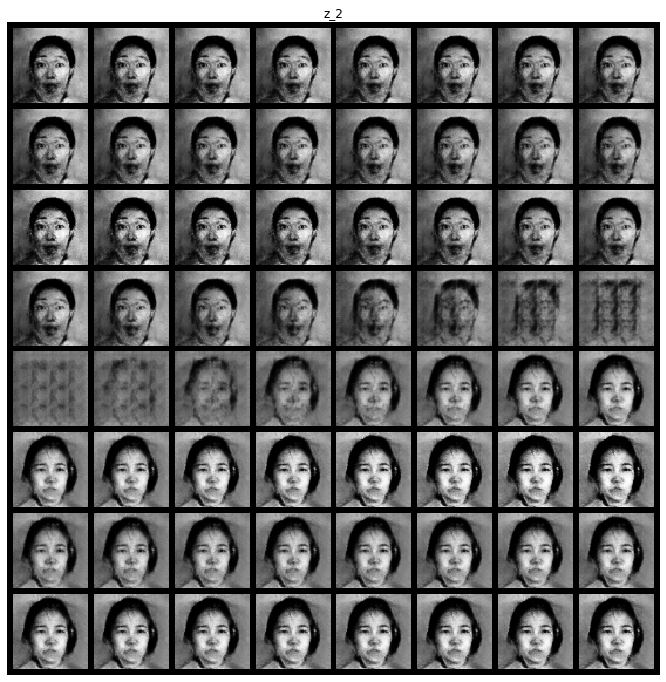

In [126]:
start  = -2
end    =  2
steps  = 64
nz_max = 3

dz = torch.zeros(64, nz, 1, 1).to(device)
d = torch.linspace(start, end, steps=steps).to(device)

with torch.no_grad():
    for iz in range(nz_max):
        
        dz[:,iz,0,0] = d
        
        fake_dz = netG(dz).detach().cpu()
        grid = vutils.make_grid(fake_dz, padding=5, normalize=True)
        
        plt.figure(figsize=(12,12))
        plt.subplot(111)
        plt.axis("off")
        plt.title("z_%d" % iz)
        plt.imshow(np.transpose(grid, (1,2,0)))
#         plt.savefig('dz_%d.png' % iz)
        plt.show()
    
        dz[:,iz,0,0] = 0.0